In [1]:
from experiments.sol_propagator import PDESolutionPropogator
from experiments.generate_graphs import *
import numpy as np

## Erdos-Renyi graphs
### Make synthetic data

In [2]:
graphs, adj_matrix = make_graphs()

n_nodes	 p_connectivity	 edge_matrix shape/% of n_nodes with edges

250	 0.05		 (2, 1608)	6.43%
250	 0.01		 (2, 348)	1.39%
250	 0.005		 (2, 195)	0.78%
250	 0.001		 (2, 39)	0.16%
250	 0.0005		 (2, 15)	0.06%


350	 0.05		 (2, 3097)	8.85%
350	 0.01		 (2, 655)	1.87%
350	 0.005		 (2, 362)	1.03%
350	 0.001		 (2, 80)	0.23%
350	 0.0005		 (2, 37)	0.11%


450	 0.05		 (2, 4989)	11.09%
450	 0.01		 (2, 1026)	2.28%
450	 0.005		 (2, 541)	1.20%
450	 0.001		 (2, 111)	0.25%
450	 0.0005		 (2, 53)	0.12%


550	 0.05		 (2, 7480)	13.60%
550	 0.01		 (2, 1515)	2.75%
550	 0.005		 (2, 788)	1.43%
550	 0.001		 (2, 163)	0.30%
550	 0.0005		 (2, 74)	0.13%




compute topology and plots:

In [3]:
# sparse_adj = [sparse.csr_matrix(A) for A in adj_matrix]
# X_ggd = GraphGeodesicDistance(directed=False, unweighted=True, method="D").fit_transform(sparse_adj)
# diagrams = VietorisRipsPersistence(metric="precomputed").fit_transform(X_ggd)

# plt_graphs = graphs

# figsize_inches = 4
# num_cols = 3
# fig, ax = plt.subplots(len(plt_graphs), 3, figsize=(figsize_inches*num_cols, 
#                                                     figsize_inches*len(plt_graphs)), dpi=250)

# cmap = matplotlib.colors.ListedColormap(['blue', 'gold'])

# for idx, graph in enumerate(plt_graphs):
    
#     nx.draw_networkx(graphs[idx], ax=ax[idx, 0], edge_color="lightgray", alpha=0.75,
#                      node_size=10, node_color="darkgray", with_labels=False)
#     ax[idx, 0].set_title("Graph")
    
#     degree_sequence = sorted([d for n, d in graphs[idx].degree()], reverse=True)
#     degreeCount = Counter(degree_sequence)
#     deg, cnt = zip(*degreeCount.items())
    
#     ax[idx, 1].bar(deg, cnt, width=0.80, color='b')
#     ax[idx, 1].set_ylabel("Count")
#     ax[idx, 1].set_xlabel("Degree")
#     ax[idx, 1].set_xticks([d for d in deg])
#     ax[idx, 1].set_xticklabels(deg, fontsize=8)
#     ax[idx, 1].set_title("Degree Histogram")
    
#     dgm = diagrams[idx]
#     H0_dgm, H1_dgm = get_multipicity(dgm)
#     plt_diag(ax[idx, 2], H0_dgm, H1_dgm)
#     ax[idx, 2].set_title("Persistence Diagram")

# fig.tight_layout()
# plt.savefig('ER_graphs.png')  
# plt.show()

#### Solve wave equation (numerical solution, finite differences)

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# laplacian_mat = nx.normalized_laplacian_matrix(graphs[graph_idx]).tocsc()
# oper = PDESolutionPropogator(laplacian_mat, device, eps=1e-5)

In [5]:
# x_init = torch.zeros(graphs[graph_idx].number_of_nodes(), dtype=torch.float)
# x_init[50] = 1.0 # Dirac delta
# x = x_init.view(-1, 1, 1).to(device)
# ts = torch.linspace(0, 10, 100).float().to(device)
# y2 = oper.propogateHeat(x, ts)

# plt.imshow(y2.squeeze().cpu().numpy())
# plt.colorbar()
# plt.ylabel("Time")
# plt.xlabel("Nodes")
# plt.title('Heat')
# plt.show()

# ts = torch.linspace(0, 10, 100).float().to(device)
# y2 = oper.propogateWave(x, x, ts)

# plt.imshow(y2.squeeze().cpu().numpy())
# plt.colorbar()
# plt.ylabel("Time")
# plt.xlabel("Nodes")
# plt.title('Wave')
# plt.show()

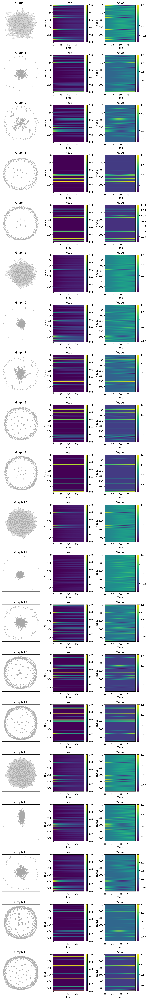

In [6]:
figsize_inches = 3
fig, axes = plt.subplots(len(graphs), 3, figsize=(figsize_inches*3, figsize_inches*len(graphs)), dpi=250)
for graph_idx in range(len(graphs)):
    graph = graphs[graph_idx]
    laplacian_mat = nx.normalized_laplacian_matrix(graph).tocsc()
    oper = PDESolutionPropogator(laplacian_mat, device, eps=1e-5)
    p = torch.empty(graph.number_of_nodes()).uniform_(0, 0.2)
    x_init = torch.bernoulli(p).float().to(device)
    x = x_init.view(-1, 1, 1).to(device)

    ts = torch.linspace(0, 10, 100).float().to(device)
    yHeat = oper.propogateHeat(x, ts, c=0.5)
    yWave = oper.propogateWave(x, 0.1 * x, ts, c=0.5)

    nx.draw_networkx(graph, ax=axes[graph_idx, 0], edge_color="lightgray", alpha=0.75,
                     node_size=10, node_color="darkgray", with_labels=False)
    axes[graph_idx, 0].set_title(f"Graph {graph_idx}")

    # Heat subplot
    im1 = axes[graph_idx, 1].imshow(yHeat.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im1, ax=axes[graph_idx, 1])
    axes[graph_idx, 1].set_xlabel("Time")
    axes[graph_idx, 1].set_ylabel("Nodes")
    axes[graph_idx, 1].set_title("Heat")

    # Wave subplot
    im2 = axes[graph_idx, 2].imshow(yWave.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im2, ax=axes[graph_idx, 2])
    axes[graph_idx, 2].set_xlabel("Time")
    axes[graph_idx, 2].set_ylabel("Nodes")
    axes[graph_idx, 2].set_title("Wave")

    # plt.suptitle(f"Graph {graph_idx}")

    # Display the subplots
    plt.tight_layout()
plt.show()

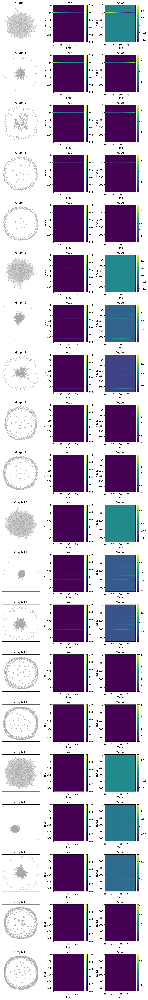

In [7]:
figsize_inches = 3
fig, axes = plt.subplots(len(graphs), 3, figsize=(figsize_inches*3, figsize_inches*len(graphs)), dpi=250)
for graph_idx in range(len(graphs)):
    graph = graphs[graph_idx]
    laplacian_mat = nx.normalized_laplacian_matrix(graph).tocsc()
    oper = PDESolutionPropogator(laplacian_mat, device, eps=1e-5)
    p = torch.empty(graph.number_of_nodes()).uniform_(0, 0.2)
    x_init = torch.zeros(graph.number_of_nodes(), dtype=torch.float, device=device)
    x_init[50] = 1. # Dirac delta

    x = x_init.view(-1, 1, 1).to(device)

    ts = torch.linspace(0, 10, 100).float().to(device)
    yHeat = oper.propogateHeat(x, ts, c=0.5)
    yWave = oper.propogateWave(x, x, ts, c=0.5)

    nx.draw_networkx(graph, ax=axes[graph_idx, 0], edge_color="lightgray", alpha=0.75,
                     node_size=10, node_color="darkgray", with_labels=False)
    axes[graph_idx, 0].set_title(f"Graph {graph_idx}")

    # Heat subplot
    im1 = axes[graph_idx, 1].imshow(yHeat.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im1, ax=axes[graph_idx, 1])
    axes[graph_idx, 1].set_xlabel("Time")
    axes[graph_idx, 1].set_ylabel("Nodes")
    axes[graph_idx, 1].set_title("Heat")

    # Wave subplot
    im2 = axes[graph_idx, 2].imshow(yWave.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im2, ax=axes[graph_idx, 2])
    axes[graph_idx, 2].set_xlabel("Time")
    axes[graph_idx, 2].set_ylabel("Nodes")
    axes[graph_idx, 2].set_title("Wave")

    # plt.suptitle(f"Graph {graph_idx}")

    # Display the subplots
    plt.tight_layout()
plt.show()

In [8]:
Gone = nx.grid_2d_graph(4,4)
Atwo = nx.to_numpy_array(nx.grid_2d_graph(4,4))
for i in range(Atwo.shape[0]):
    connecind = np.argwhere(Atwo[i,:] == 1).squeeze()
    rmind = np.random.choice(connecind,size=1)
    Atwo[i,rmind] = 0
Gtwo = nx.from_numpy_array(Atwo)
n = 10
Athree = np.zeros((n,n))
for i in range(n):
    if i == n-1:
        Athree[i,0] = 1
        break
    Athree[i,i+1] = 1
Gthree = nx.from_numpy_array(Athree)
n = 10
Afour = np.zeros((n,n))
for i in range(n):
    if i == n-1:
        Afour[i,0] = 1
        break
    Afour[i,i+1] = 1
Afour[5,0] = 1
Gfour = nx.from_numpy_array(Afour)

n = 10
Afive = np.zeros((n,n))
for i in range(n):
    if i == n-1:
        Afive[i,0] = 1
        break
    Afive[i,i+1] = 1
Afive[0, 0] = 1 # self-loop
Gfive = nx.from_numpy_array(Afive)

n = 10
Asix = np.zeros((n,n))
for i in range(1, n):
    if i == n-1:
        Asix[i,0] = 1
        break
    Asix[i,i+1] = 1
Asix[0, 0] = 1
Gsix = nx.from_numpy_array(Asix)

n = 10
Aseven = np.zeros((n,n))
for i in range(1, n):
    if i == n-1:
        Aseven[i,1] = 1
        break
    Aseven[i,i+1] = 1
# Aseven[0, 0] = 1
Gseven = nx.from_numpy_array(Aseven)

n = 10
Aeight = np.zeros((n,n))
for i in range(5):
    if i == 5-1:
        Aeight[i,1] = 1
        break
    Aeight[i,i+1] = 1

for i in range(5, n):
    if i == n-1:
        Aeight[i,5] = 1
        break
    Aeight[i,i+1] = 1

Geight = nx.from_numpy_array(Aeight)

graphs = [Gone, Gtwo, Gfour, Gthree, Gfive, Gsix, Gseven, Geight]

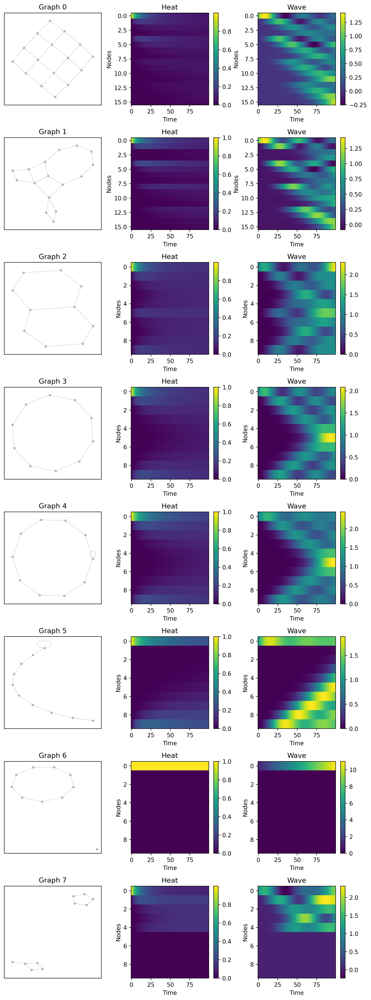

In [9]:
figsize_inches = 3
fig, axes = plt.subplots(len(graphs), 3, figsize=(figsize_inches*3, figsize_inches*len(graphs)), dpi=250)
for graph_idx in range(len(graphs)):
    graph = graphs[graph_idx]
    laplacian_mat = nx.normalized_laplacian_matrix(graph).tocsc()
    oper = PDESolutionPropogator(laplacian_mat, device, eps=1e-5)
    p = torch.empty(graph.number_of_nodes()).uniform_(0, 0.2)
    x_init = torch.zeros(graph.number_of_nodes(), dtype=torch.float, device=device)
    x_init[0] = 1. # Dirac delta

    x = x_init.view(-1, 1, 1).to(device)

    ts = torch.linspace(0, 10, 100).float().to(device)
    yHeat = oper.propogateHeat(x, ts, c=1.)
    yWave = oper.propogateWave(x, x, ts, c=1.)

    nx.draw_networkx(graph, ax=axes[graph_idx, 0], edge_color="lightgray", alpha=0.75,
                     node_size=10, node_color="darkgray", with_labels=False)
    axes[graph_idx, 0].set_title(f"Graph {graph_idx}")

    # Heat subplot
    im1 = axes[graph_idx, 1].imshow(yHeat.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im1, ax=axes[graph_idx, 1])
    axes[graph_idx, 1].set_xlabel("Time")
    axes[graph_idx, 1].set_ylabel("Nodes")
    axes[graph_idx, 1].set_title("Heat")

    # Wave subplot
    im2 = axes[graph_idx, 2].imshow(yWave.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im2, ax=axes[graph_idx, 2])
    axes[graph_idx, 2].set_xlabel("Time")
    axes[graph_idx, 2].set_ylabel("Nodes")
    axes[graph_idx, 2].set_title("Wave")

    # plt.suptitle(f"Graph {graph_idx}")

    # Display the subplots
    plt.tight_layout()
plt.show()

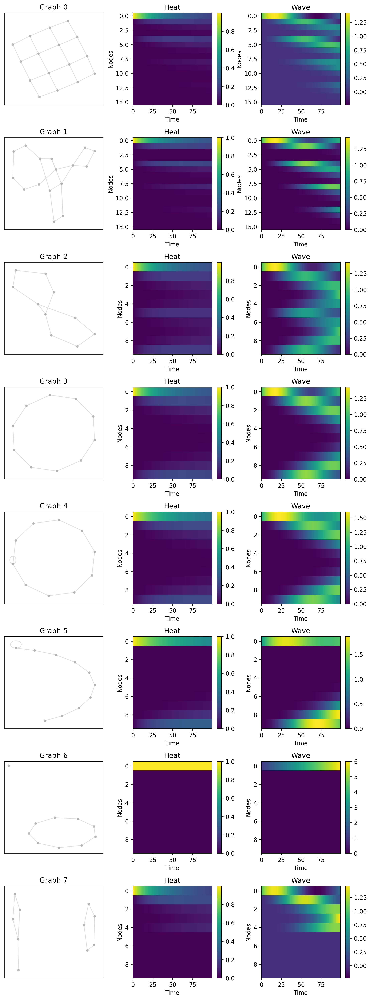

In [10]:
figsize_inches = 3
fig, axes = plt.subplots(len(graphs), 3, figsize=(figsize_inches*3, figsize_inches*len(graphs)), dpi=250)
for graph_idx in range(len(graphs)):
    graph = graphs[graph_idx]
    laplacian_mat = nx.normalized_laplacian_matrix(graph).tocsc()
    oper = PDESolutionPropogator(laplacian_mat, device, eps=1e-5)
    p = torch.empty(graph.number_of_nodes()).uniform_(0, 0.2)
    x_init = torch.zeros(graph.number_of_nodes(), dtype=torch.float, device=device)
    x_init[0] = 1. # Dirac delta

    x = x_init.view(-1, 1, 1).to(device)

    ts = torch.linspace(0, 10, 100).float().to(device)
    yHeat = oper.propogateHeat(x, ts, c=.5)
    yWave = oper.propogateWave(x, x, ts, c=.5)

    nx.draw_networkx(graph, ax=axes[graph_idx, 0], edge_color="lightgray", alpha=0.75,
                     node_size=10, node_color="darkgray", with_labels=False)
    axes[graph_idx, 0].set_title(f"Graph {graph_idx}")

    # Heat subplot
    im1 = axes[graph_idx, 1].imshow(yHeat.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im1, ax=axes[graph_idx, 1])
    axes[graph_idx, 1].set_xlabel("Time")
    axes[graph_idx, 1].set_ylabel("Nodes")
    axes[graph_idx, 1].set_title("Heat")

    # Wave subplot
    im2 = axes[graph_idx, 2].imshow(yWave.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im2, ax=axes[graph_idx, 2])
    axes[graph_idx, 2].set_xlabel("Time")
    axes[graph_idx, 2].set_ylabel("Nodes")
    axes[graph_idx, 2].set_title("Wave")

    # plt.suptitle(f"Graph {graph_idx}")

    # Display the subplots
    plt.tight_layout()
plt.show()

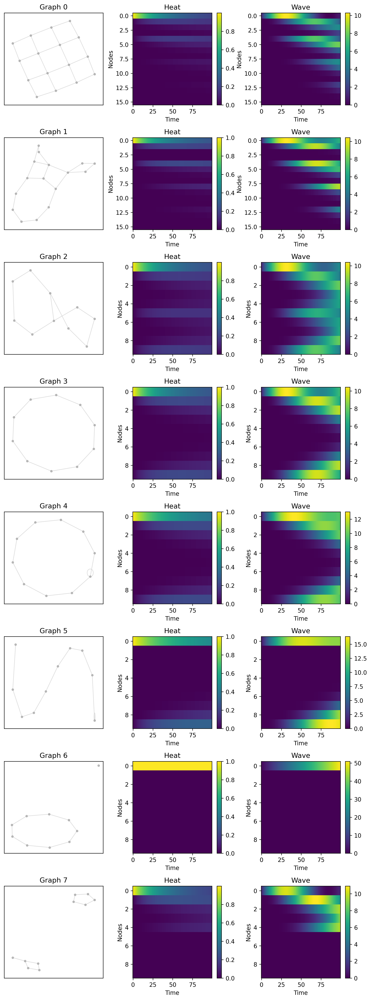

In [11]:
figsize_inches = 3
fig, axes = plt.subplots(len(graphs), 3, figsize=(figsize_inches*3, figsize_inches*len(graphs)), dpi=250)
for graph_idx in range(len(graphs)):
    graph = graphs[graph_idx]
    laplacian_mat = nx.normalized_laplacian_matrix(graph).tocsc()
    oper = PDESolutionPropogator(laplacian_mat, device, eps=1e-5)
    p = torch.empty(graph.number_of_nodes()).uniform_(0, 0.2)
    x_init = torch.zeros(graph.number_of_nodes(), dtype=torch.float, device=device)
    x_init[0] = 1. # Dirac delta

    x = x_init.view(-1, 1, 1).to(device)

    ts = torch.linspace(0, 10, 100).float().to(device)
    yHeat = oper.propogateHeat(x, ts, c=.5)
    yWave = oper.propogateWave(x, 10 * x, ts, c=.5)

    nx.draw_networkx(graph, ax=axes[graph_idx, 0], edge_color="lightgray", alpha=0.75,
                     node_size=10, node_color="darkgray", with_labels=False)
    axes[graph_idx, 0].set_title(f"Graph {graph_idx}")

    # Heat subplot
    im1 = axes[graph_idx, 1].imshow(yHeat.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im1, ax=axes[graph_idx, 1])
    axes[graph_idx, 1].set_xlabel("Time")
    axes[graph_idx, 1].set_ylabel("Nodes")
    axes[graph_idx, 1].set_title("Heat")

    # Wave subplot
    im2 = axes[graph_idx, 2].imshow(yWave.squeeze().cpu().numpy().T, aspect='auto')
    fig.colorbar(im2, ax=axes[graph_idx, 2])
    axes[graph_idx, 2].set_xlabel("Time")
    axes[graph_idx, 2].set_ylabel("Nodes")
    axes[graph_idx, 2].set_title("Wave")

    # plt.suptitle(f"Graph {graph_idx}")

    # Display the subplots
    plt.tight_layout()
plt.show()